In [1]:

library(Matrix)
library(Seurat)
library(Matrix)

gene_count <- readMM("//genecount.mtx")
df_cell <- read.csv("//df_cell.csv")
df_gene <- read.csv("//df_gene.csv")

colnames(gene_count) = df_cell$cell_name_temp #your cell name column
rownames(gene_count) = df_gene$Gene_name
#must do this
rownames(df_cell) <- df_cell$cell_name_temp
# Now, proceed with creating the Seurat object
Iris_Seurat <- CreateSeuratObject(counts = gene_count, meta.data = df_cell, project = "Spatial", assay = "RNA")
Iris_Seurat <- subset(Iris_Seurat, subset = nCount_RNA >= 400)



Warning message:
“package ‘Seurat’ was built under R version 4.0.5”
Attaching SeuratObject

Attaching sp

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [ ]:
Iris_Seurat <- NormalizeData(Iris_Seurat)
Iris_Seurat <- FindVariableFeatures(Iris_Seurat, selection.method = "vst", nfeatures = 10000)


# plot variable features with and without labels
plot1 <- VariableFeaturePlot(Iris_Seurat)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + plot2
all.genes <- rownames(Iris_Seurat)
Iris_Seurat <- ScaleData(Iris_Seurat, features = all.genes)
Iris_Seurat <- RunPCA(Iris_Seurat, features = VariableFeatures(object = Iris_Seurat),npcs=25)
Iris_Seurat <- FindNeighbors(Iris_Seurat, dims = 1:50)
Iris_Seurat <- FindClusters(Iris_Seurat, resolution = 2)
Iris_Seurat <- RunUMAP(Iris_Seurat, dims = 1:40)
DimPlot(Iris_Seurat, reduction = "umap")


In [ ]:
#used this for figure
Iris_Seurat <- FindNeighbors(Iris_Seurat, dims = 1:20)
Iris_Seurat <- FindClusters(Iris_Seurat, resolution = 2)
Iris_Seurat <- RunUMAP(Iris_Seurat, dims = 1:20)
DimPlot(Iris_Seurat, reduction = "umap")



In [ ]:
#used this for figure

Iris_Seurat <- RunUMAP(Iris_Seurat, dims = 1:20,min.dist = 0.1)



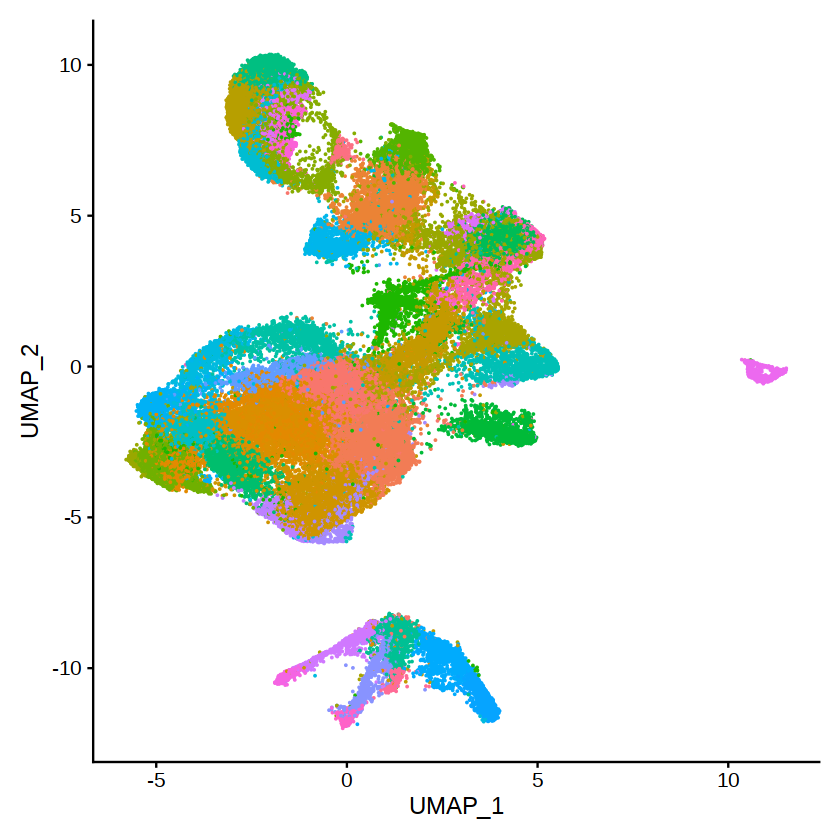

In [6]:
DimPlot(Iris_Seurat, reduction = "umap")+NoLegend()


In [7]:
Iris_Seurat <- FindClusters(Iris_Seurat, resolution = 2.2)


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 78791
Number of edges: 2351566

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8314
Number of communities: 42
Elapsed time: 19 seconds


In [8]:
Iris_Seurat <- FindClusters(Iris_Seurat, resolution = 1)


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 78791
Number of edges: 2351566

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8738
Number of communities: 25
Elapsed time: 21 seconds


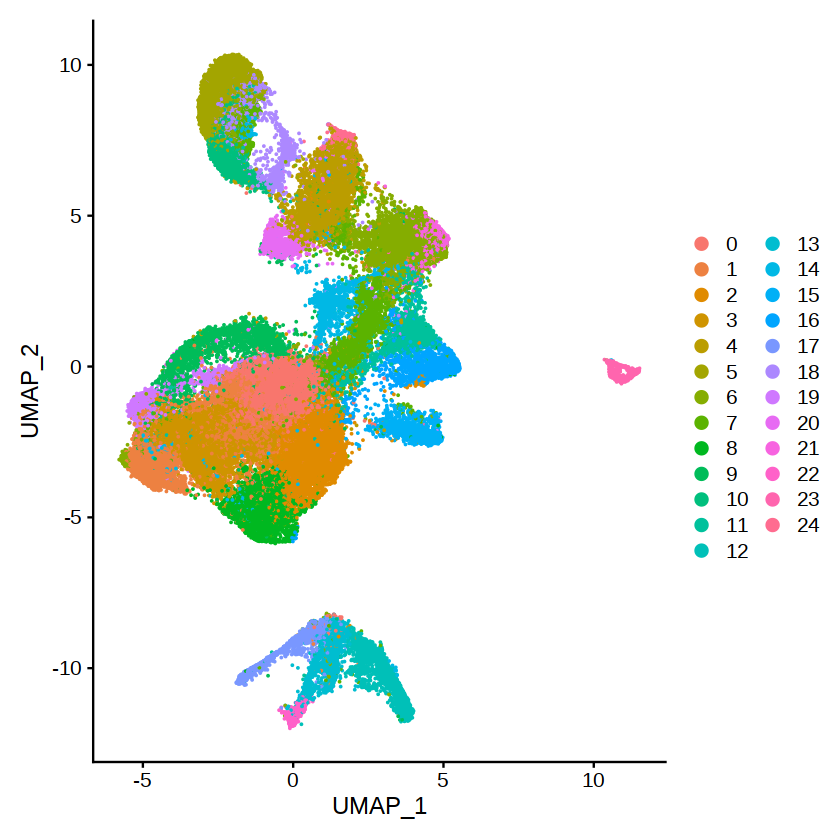

In [9]:
DimPlot(Iris_Seurat, reduction = "umap")


In [10]:
library(Matrix)
library(Seurat)
library(spacexr)
library(Matrix)
library(doParallel)


Loading required package: foreach

Loading required package: iterators

Loading required package: parallel



In [11]:
RTCD = readRDS("../10um_RDS.rds")

In [12]:
weights <- RTCD@results$weights
norm_weights <- normalize_weights(weights)
barcodes <- colnames(RTCD@spatialRNA@counts)
weights <- RTCD@results$weights
RTCD <- as.data.frame(norm_weights)


In [13]:
#adding umap coords 
# Extract UMAP coordinates
umap_coords <- Iris_Seurat@meta.data[, c("UMAP1", "UMAP2")]

# Set UMAP embeddings in the Seurat object
Iris_Seurat[["umapSpatial"]] <- CreateDimReducObject(embeddings = as.matrix(umap_coords), key = "UMAP_")


Warning message:
“No assay specified, setting assay as RNA by default.”
Warning message:
“Cannot add objects with duplicate keys (offending key: UMAP_), setting key to 'umapspatial_'”


In [14]:
# Assuming 'your_seurat_object' is your Seurat object
# Extract the relevant columns into a matrix
columns_of_interest <- c('Astro_AMY', 'Astro_AMY_CTX', 'Astro_CTX', 'Astro_HPC', 
                         'Astro_HYPO', 'Astro_STR', 'Astro_THAL_hab', 'Astro_THAL_lat', 
                         'Astro_THAL_med', 'Astro_WM', 'Endo', 'Ext_Amy_1', 'Ext_Amy_2', 
                         'Ext_ClauPyr', 'Ext_Hpc_CA1', 'Ext_Hpc_CA2', 'Ext_Hpc_CA3', 
                         'Ext_Hpc_DG1', 'Ext_Hpc_DG2', 'Ext_L23', 'Ext_L25', 'Ext_L5_1', 
                         'Ext_L5_2', 'Ext_L5_3', 'Ext_L56', 'Ext_L6', 'Ext_L6B', 'Ext_Med', 
                         'Ext_Pir', 'Ext_Thal_1', 'Ext_Thal_2', 'Ext_Unk_1', 'Ext_Unk_2', 
                         'Ext_Unk_3', 'Inh_1', 'Inh_2', 'Inh_3', 'Inh_4', 'Inh_5', 'Inh_6', 
                         'Inh_Lamp5', 'Inh_Meis2_1', 'Inh_Meis2_2', 'Inh_Meis2_3', 
                         'Inh_Meis2_4', 'Inh_Pvalb', 'Inh_Sst', 'Inh_Vip', 'LowQ_1', 
                         'LowQ_2', 'Micro', 'Nb_1', 'Nb_2', 'Oligo_1', 'Oligo_2', 
                         'OPC_1', 'OPC_2', 'Unk_1', 'Unk_2')

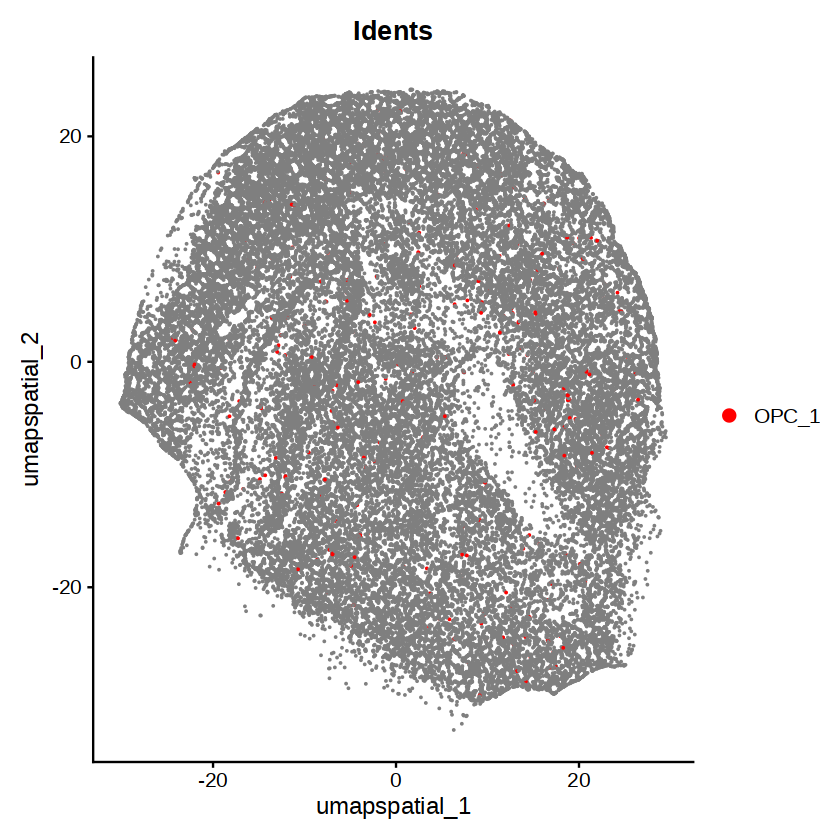

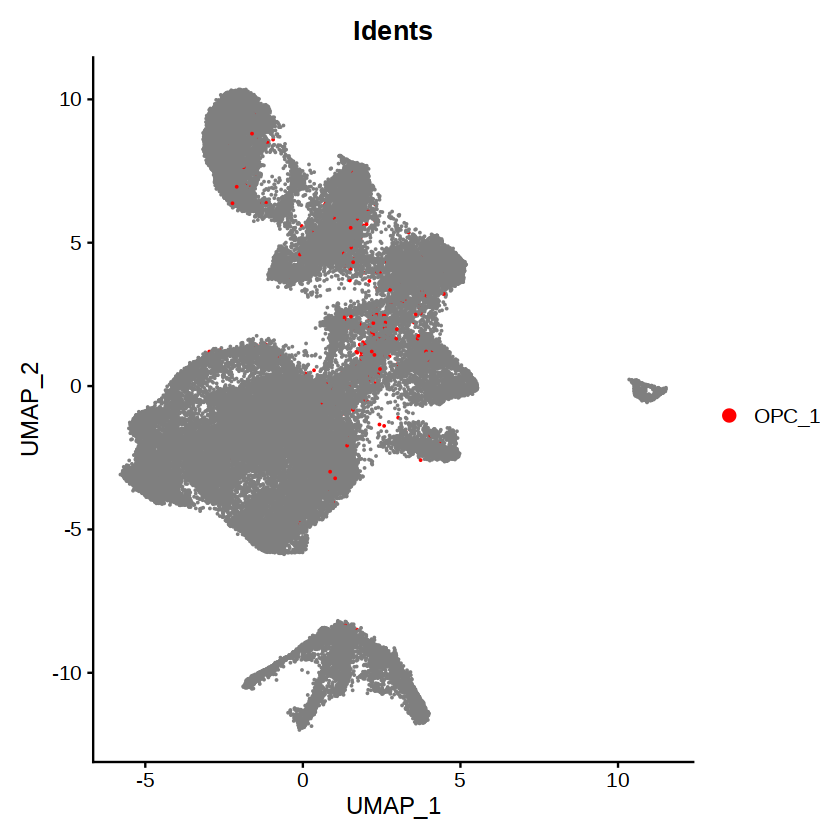

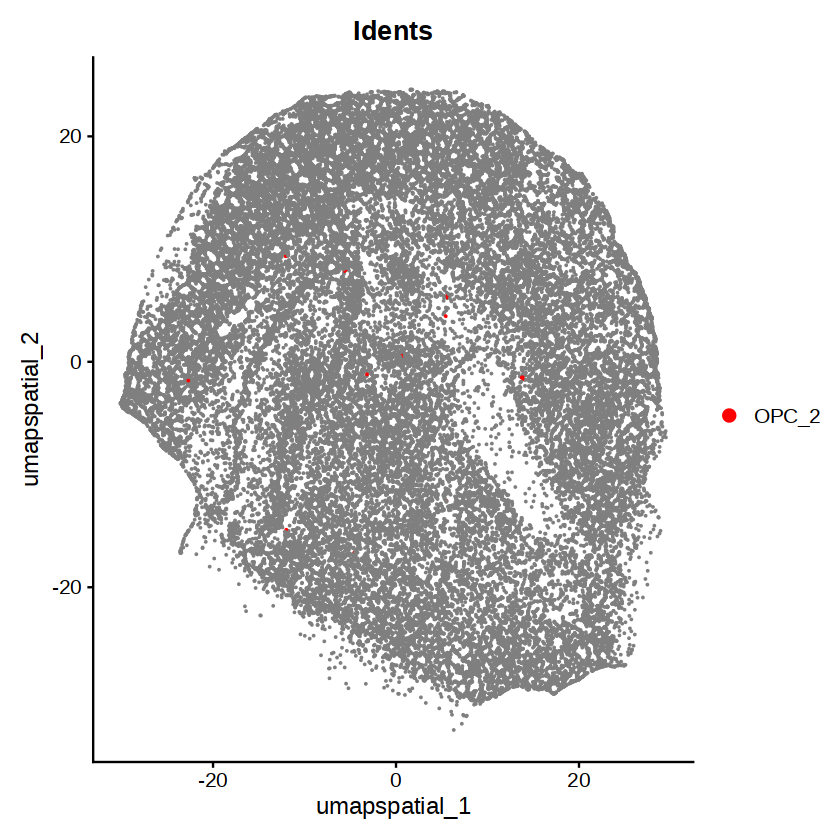

[1] "Inh_3"          "Ext_Amy_2"      "Unk_1"          "Ext_L56"       
    [5] "Unk_1"          "Ext_Pir"        "Oligo_2"        "Unk_1"         
    [9] "LowQ_1"         "Oligo_2"        "Unk_1"          "Ext_Thal_1"    
   [13] "Unk_1"          "Ext_Med"        "Ext_Hpc_CA2"    "Unk_1"         
   [17] "LowQ_1"         "Ext_Unk_2"      "Unk_2"          "Unk_1"         
   [21] "Unk_1"          "Ext_L23"        "Ext_Hpc_DG2"    "Unk_1"         
   [25] "Ext_Thal_1"     "Unk_1"          "Unk_1"          "Unk_1"         
   [29] "Ext_Thal_1"     "Oligo_2"        "Endo"           "Inh_2"         
   [33] "Ext_L5_2"       "Ext_Thal_2"     "Ext_Hpc_DG2"    "Unk_1"         
   [37] "Inh_6"          "Oligo_2"        "Ext_Thal_1"     "Unk_1"         
   [41] "Unk_1"          "Inh_Meis2_2"    "Ext_Hpc_CA1"    "Ext_L23"       
   [45] "Unk_1"          "Unk_1"          "Ext_Hpc_DG2"    "Ext_Hpc_CA3"   
   [49] "Ext_Unk_1"      "Ext_ClauPyr"    "Inh_Meis2_2"    "Unk_1"         
   [53] "Astro_WM"       "Astro_STR"      "Oligo_2"        "Inh_Sst"       
   [57] "Inh_5"          "Astro_CTX"      "Inh_Meis2_3"    "Ext_Thal_1"    
   [61] "Unk_1"          "Inh_Pvalb"      "Ext_L25"        "Oligo_1"       
   [65] "Ext_Hpc_CA1"    "Ext_L23"        "Inh_3"          "Nb_2"          
   [69] "Unk_1"          "Astro_WM"       "Ext_Thal_1"     "Ext_Hpc_CA3"   
   [73] "Oligo_2"        "Ext_Amy_2"      "Oligo_2"        "Nb_1"          
   [77] "Astro_WM"       "Ext_Hpc_CA2"    "Unk_1"          "Unk_1"         
   [81] "Astro_THAL_med" "Ext_Amy_2"      "Ext_Thal_1"     "Ext_Thal_1"    
   [85] "Micro"          "Unk_1"          "Astro_THAL_hab" "Unk_1"         
   [89] "Unk_1"          "Ext_L25"        "LowQ_1"         "Ext_L6B"       
   [93] "Inh_Meis2_2"    "Ext_Thal_1"     "Ext_L6"         "Unk_1"         
   [97] "Ext_L25"        "Astro_WM"       "Oligo_2"        "Oligo_1"       
  [101] "Ext_Thal_1"     "Unk_1"          "Unk_1"          "Unk_1"         
  [105] "Inh_5"          "Unk_1"          "Ext_Thal_2"     "Endo"          
  [109] "Ext_L23"        "Unk_1"          "Unk_1"          "Astro_WM"      
  [113] "LowQ_2"         "Micro"          "Nb_1"           "Unk_1"         
  [117] "Ext_Amy_1"      "Ext_L56"        "OPC_1"          "Inh_4"         
  [121] "Unk_1"          "Ext_Thal_1"     "Ext_L23"        "Inh_Meis2_3"   
  [125] "Inh_Meis2_4"    "Oligo_2"        "Inh_1"          "Ext_Amy_2"     
  [129] "Ext_Thal_1"     "Ext_Thal_1"     "Ext_L6"         "Inh_Meis2_3"   
  [133] "Endo"           "Astro_STR"      "Unk_1"          "Ext_L56"       
  [137] "Ext_Amy_1"      "Unk_1"          "Unk_1"          "Ext_L6"        
  [141] "Ext_Hpc_CA3"    "Unk_1"          "Unk_1"          "Endo"          
  [145] "Astro_HPC"      "Unk_1"          "Unk_1"          "LowQ_1"        
  [149] "Ext_Thal_1"     "Ext_L6B"        "Unk_1"          "Oligo_2"       
  [153] "Unk_1"          "Oligo_2"        "Unk_1"          "Unk_1"         
  [157] "Ext_Amy_2"      "Oligo_2"        "Unk_1"          "Nb_2"          
  [161] "Unk_1"          "Unk_2"          "Unk_1"          "Ext_Thal_1"    
  [165] "Ext_L25"        "Inh_5"          "Ext_Hpc_DG1"    "Unk_1"         
  [169] "LowQ_1"         "Oligo_1"        "Ext_Thal_1"     "Ext_Thal_1"    
  [173] "Ext_Thal_1"     "Ext_Thal_1"     "Inh_1"          "Ext_Hpc_CA3"   
  [177] "Unk_1"          "Unk_1"          "Ext_Amy_1"      "Oligo_2"       
  [181] "Unk_1"          "Unk_1"          "Unk_1"          "Ext_Thal_1"    
  [185] "Oligo_2"        "Ext_Unk_3"      "Unk_1"          "Ext_Thal_1"    
  [189] "Inh_3"          "Unk_1"          "Unk_1"          "Inh_3"         
  [193] "Astro_AMY"      "Oligo_2"        "Ext_Hpc_CA1"    "Unk_1"         
  [197] "Ext_Thal_1"     "Unk_1"          "LowQ_1"         "Ext_Thal_1"    
  [201] "Astro_WM"       "Inh_Meis2_4"    "Ext_Thal_1"     "Unk_1"         
  [205] "Unk_1"          "Oligo_2"        "Ext_Amy_2"      "Inh_4"         
  [209] "Ext_L25"        "Ext_Hpc_DG2"    "Inh_Meis2

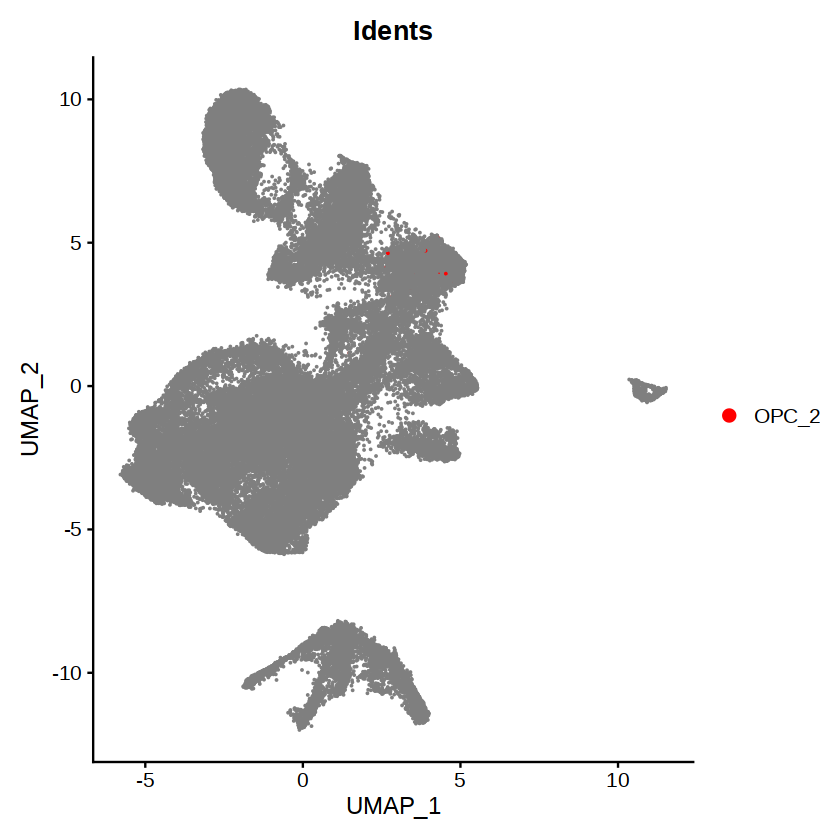

In [25]:
DimPlot(Iris_Seurat,reduction="umapSpatial", group.by = "Idents", cols = c("OPC_1"="red"))
DimPlot(Iris_Seurat, group.by = "Idents", cols = c("OPC_1"="red"))

DimPlot(Iris_Seurat,reduction="umapSpatial", group.by = "Idents", cols = c("OPC_2"="red"))
DimPlot(Iris_Seurat, group.by = "Idents", cols = c("OPC_2"="red"))


Iris_Seurat@meta.data$Idents
#Astro_AMY, Astro_AMY_CTX, Astro_CTX, , Astro_STR, Astro_THAL_hab,Astro_THAL_lat,Astro_THAL_med=Astrocytes
#Astro_WM=Astrocytes_WM
#Astro_HYPO=Astrocytes_Hypo
#Endo=Endo
#Ext_Amy_1=Ext_Amy_1
#Ext_Amy_2=Ext_Amy_2
#Inh_1=Inh_Amy
#Ext_ClauPyr=Ext_ClauPyr
#Ext_Hpc_CA1=Ext_Hpc_CA1
#Ext_Hpc_CA2=Ext_Hpc_CA2
#Ext_Hpc_CA3=Ext_Hpc_CA3
#Ext_Hpc_DG1,Ext_Hpc_DG2=Ext_Hpc_DG
#Ext_L23=Ext_L23
#Ext_L25=Ext_L25
#Ext_L5_1,Ext_L5_2,Ext_L5_3=Ext_L5
#Ext_L56,Ext_L6B=Ext_L56
#Ext_Med=Ext_Med
#Ext_Pir,Ext_Unk_1=Ext_Pir
#Ext_Thal_1', 'Ext_Thal_2,Ext_Unk_3=Thalamus

#Ext_Unk_2=Ext_Unk_2
#Inh_2,Inh_3,Inh=Hypothalamus
#Inh_5=STN
#Inh_6=Habenuela
#Inh_Lamp5=Inh_Hippocampus
##Inh_Meis2_1,Inh_Meis2_2,Inh_Meis2_3=Striatal 
#Inh_Meis2_4=LGN
#Inh_Sst=Inh_Sst
#Inh_Pvalb=Inh_Pvalb
#Inh_Vip=Inh_Vip
#LowQ_1=Choroid_Plexus 
#Micro=Micro
#Nb_1,Nb_2=Nb
#Oligo_1', 'Oligo_2=Oligo
#OPC_2,OPC_1=OPC
#Unk_1', 'Unk_2-interneurons 

In [39]:
# Define the mapping dictionary
idents_mapping <- c(
  "Astro_AMY" = "Astrocytes", "Astro_AMY_CTX" = "Astrocytes", "Astro_CTX" = "Astrocytes",
  "Astro_STR" = "Astrocytes", "Astro_THAL_hab" = "Astrocytes", "Astro_THAL_lat" = "Astrocytes", 
  "Astro_THAL_med" = "Astrocytes", "Astro_WM" = "Astrocytes_WM", "Astro_HYPO" = "Astrocytes_Hypo",
  "Endo" = "Endo", "Ext_Amy_1" = "Ext_Amy_1", "Ext_Amy_2" = "Ext_Amy_2",
  "Inh_1" = "Inh_Amy", "Ext_ClauPyr" = "Ext_ClauPyr", "Ext_Hpc_CA1" = "Ext_Hpc_CA1",
  "Ext_Hpc_CA2" = "Ext_Hpc_CA2", "Ext_Hpc_CA3" = "Ext_Hpc_CA3", "Ext_Hpc_DG1" = "Ext_Hpc_DG",
  "Ext_Hpc_DG2" = "Ext_Hpc_DG", "Ext_L23" = "Ext_L23", "Ext_L25" = "Ext_L25",
  "Ext_L5_1" = "Ext_L5", "Ext_L5_2" = "Ext_L5", "Ext_L5_3" = "Ext_L5",
  "Ext_L56" = "Ext_L56", "Ext_L6B" = "Ext_L56", "Ext_Med" = "Ext_Med",
  "Ext_Pir" = "Ext_Pir", "Ext_Unk_1" = "Ext_Pir", "Ext_Thal_1" = "Thalamus",
  "Ext_Thal_2" = "Thalamus", "Ext_Unk_3" = "Thalamus", "Ext_Unk_2" = "Ext_Unk_2",
  "Inh_2" = "Hypothalamus", "Inh_3" = "Hypothalamus", "Inh" = "Hypothalamus",
  "Inh_5" = "STN", "Inh_6" = "Habenuela", "Inh_Lamp5" = "Inh_Hippocampus",
  "Inh_Meis2_1" = "Striatal", "Inh_Meis2_2" = "Striatal", "Inh_Meis2_3" = "Striatal",
  "Inh_Meis2_4" = "LGN", "Inh_Sst" = "Inh_Sst", "Inh_Pvalb" = "Inh_Pvalb",
  "Inh_Vip" = "Inh_Vip", "LowQ_1" = "Choroid_Plexus", "Micro" = "Micro",
  "Nb_1" = "Nb", "Nb_2" = "Nb", "Oligo_1" = "Oligo", "Oligo_2" = "Oligo",
  "OPC_1" = "OPC", "OPC_2" = "OPC", "Unk_1" = "interneurons", "Unk_2" = "interneurons"
)

# Create a new column with mapped values
Iris_Seurat@meta.data$NewIdents <- idents_mapping[as.character(Iris_Seurat@meta.data$Idents)]

# Ensure any NA values (unmapped identities) remain unchanged
Iris_Seurat@meta.data$NewIdents[is.na(Iris_Seurat@meta.data$NewIdents)] <- Iris_Seurat@meta.data$Idents[is.na(Iris_Seurat@meta.data$NewIdents)]

# Verify the changes
table(Iris_Seurat@meta.data$NewIdents)



      Astro_HPC      Astrocytes Astrocytes_Hypo   Astrocytes_WM  Choroid_Plexus 
           1106            9560            1781            3199            3266 
           Endo       Ext_Amy_1       Ext_Amy_2     Ext_ClauPyr     Ext_Hpc_CA1 
           4576            1312            3896            1974            5084 
    Ext_Hpc_CA2     Ext_Hpc_CA3      Ext_Hpc_DG         Ext_L23         Ext_L25 
           1616            3204            7450            4710            6014 
         Ext_L5         Ext_L56          Ext_L6         Ext_Med         Ext_Pir 
           4203            6003            1598            1616            3364 
      Ext_Unk_2       Habenuela    Hypothalamus           Inh_4         Inh_Amy 
           1583            1505            5915            2524            2894 
Inh_Hippocampus       Inh_Pvalb         Inh_Sst         Inh_Vip    interneurons 
            711            1350            1298             942           65600 
            LGN          Lo

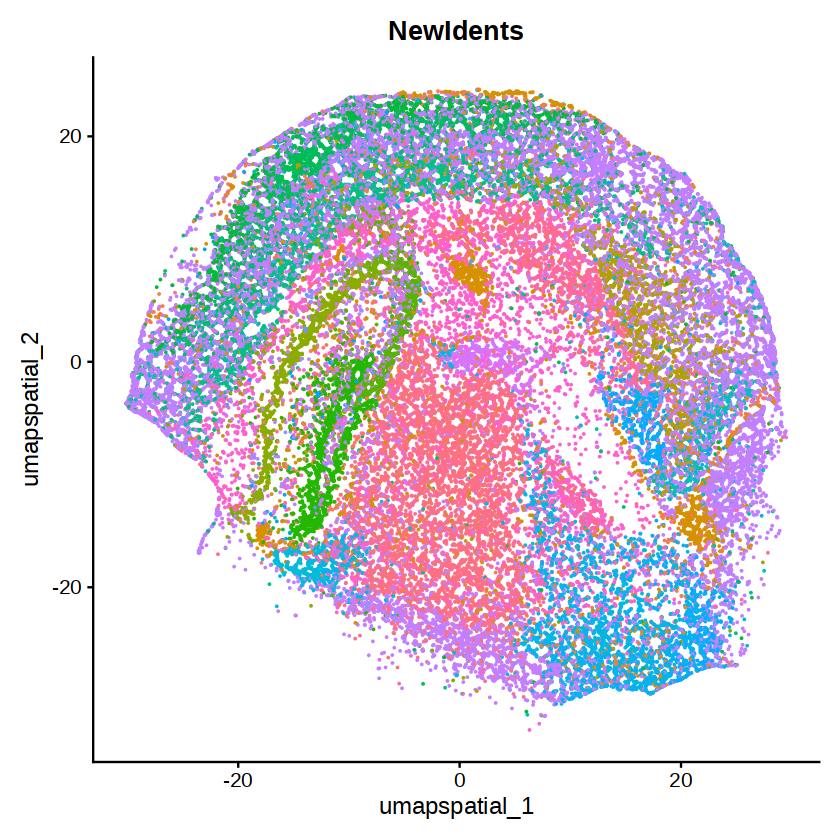

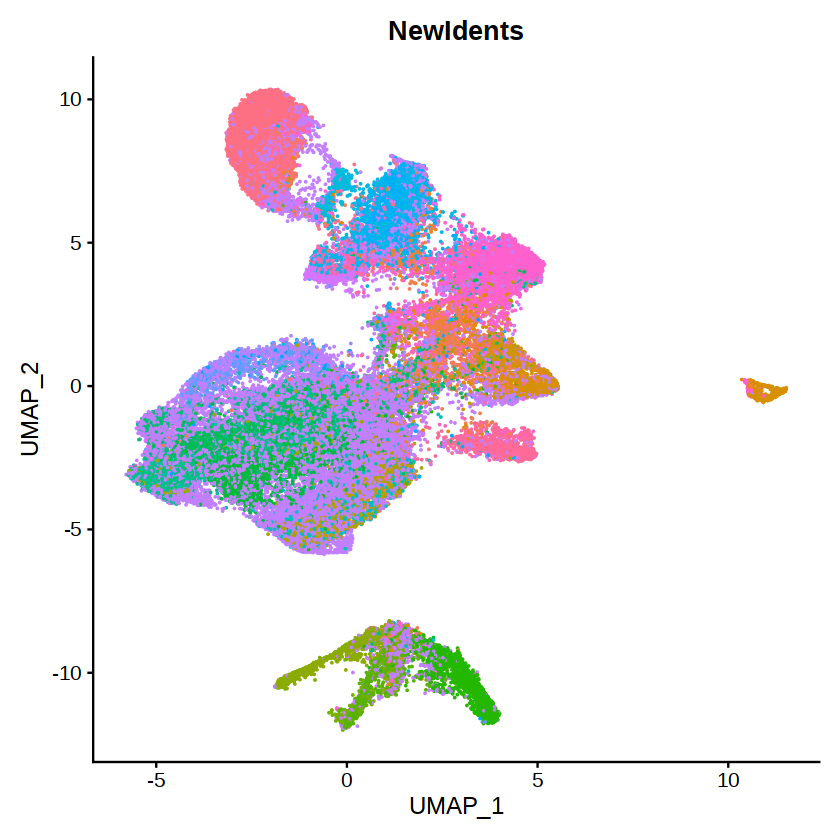

In [41]:
DimPlot(Iris_Seurat,reduction="umapSpatial", group.by = "NewIdents")+NoLegend()
DimPlot(Iris_Seurat, group.by = "NewIdents")+NoLegend()




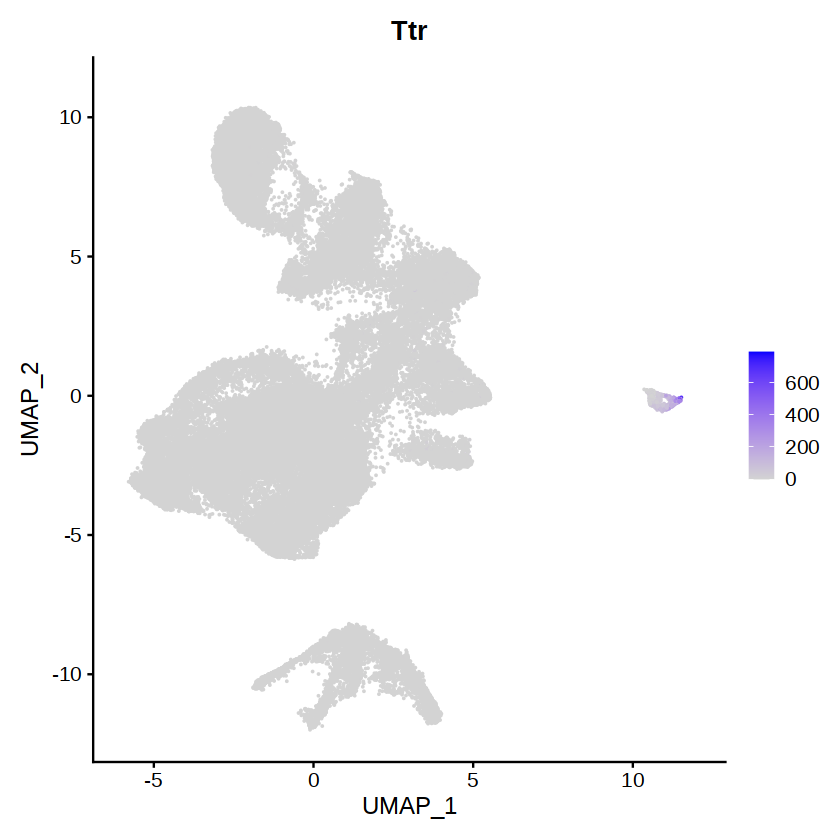

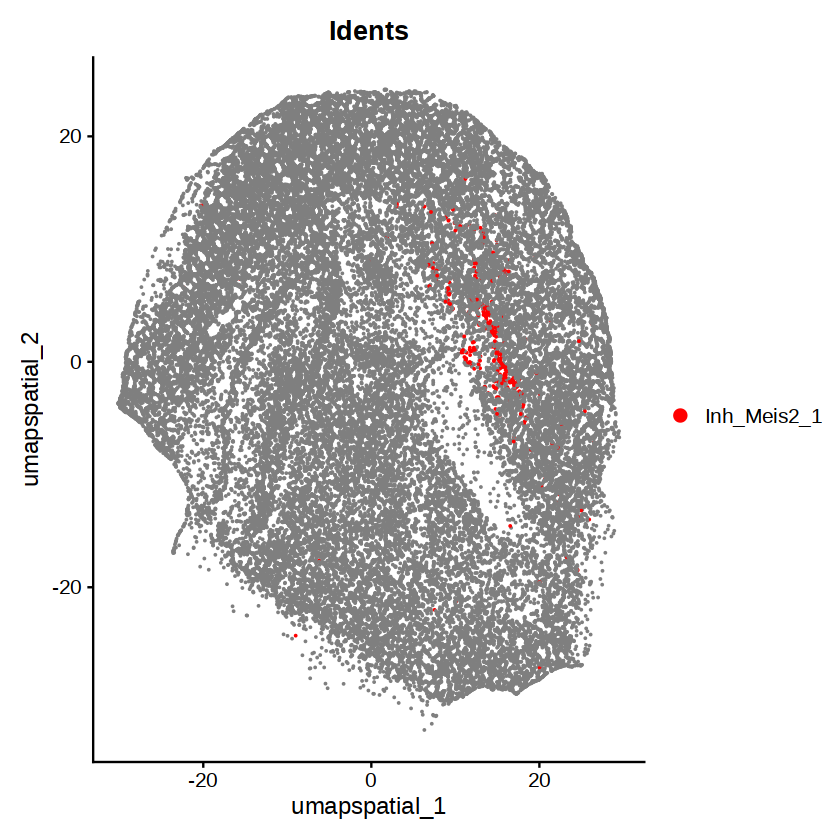

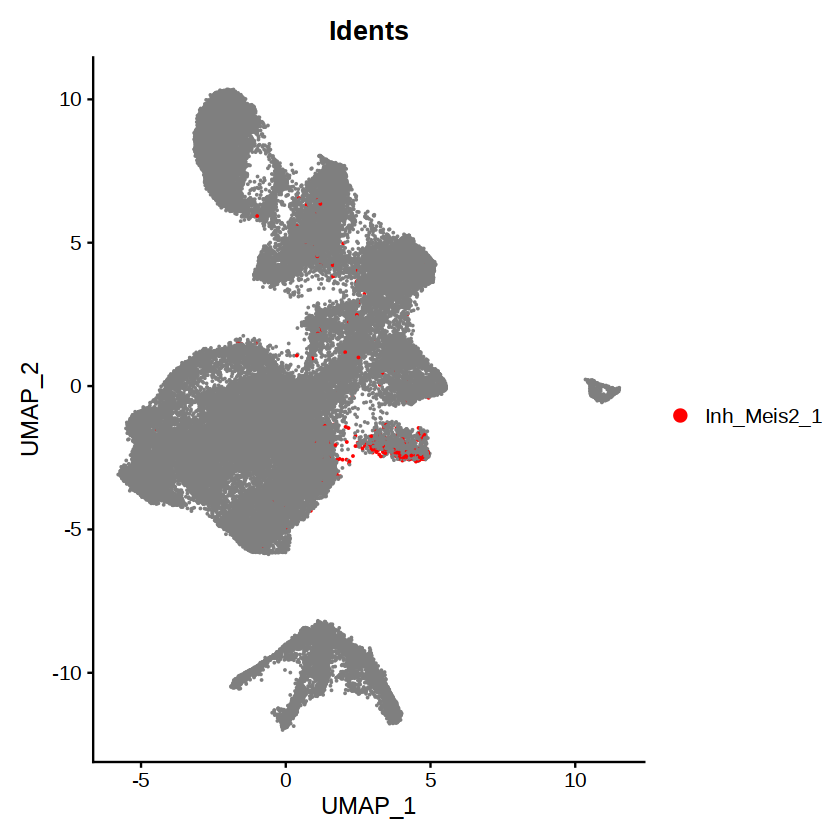

In [28]:
FeaturePlot(Iris_Seurat, "Ttr")
DimPlot(Iris_Seurat,reduction="umapSpatial", group.by = "Idents", cols = c("Inh_Meis2_1"="red"))
DimPlot(Iris_Seurat, group.by = "Idents", cols = c("Inh_Meis2_1"="red"))


In [29]:
Iris_Seurat@meta.data = RTCD[,columns_of_interest]

In [30]:


# Get the matrix of values for the specified columns
data_matrix <- FetchData(Iris_Seurat, vars = columns_of_interest)

# Identify the column with the highest value for each cell
max_id <- apply(data_matrix, 1, function(x) columns_of_interest[which.max(x)])

# Add this information as a new column in the Seurat metadata
Iris_Seurat$Idents <- max_id

# Optionally set the Seurat object identity to this new column
Idents(Iris_Seurat) <- "Idents"

# View the updated Seurat object metadata
head(Iris_Seurat@meta.data)


,Astro_AMY,Astro_AMY_CTX,Astro_CTX,Astro_HPC,Astro_HYPO,Astro_STR,Astro_THAL_hab,Astro_THAL_lat,Astro_THAL_med,Astro_WM,⋯,Micro,Nb_1,Nb_2,Oligo_1,Oligo_2,OPC_1,OPC_2,Unk_1,Unk_2,Idents
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-AACACGAC-ACGCTCTA,2.821933e-05,2.821933e-05,2.821933e-05,2.821933e-05,1.897215e-01,2.821933e-05,2.821933e-05,2.821933e-05,2.821933e-05,2.821933e-05,⋯,7.898859e-02,1.821289e-02,2.821933e-05,2.821933e-05,2.821933e-05,2.821934e-05,2.821933e-05,1.329144e-01,2.821933e-05,NA
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-AACGGAAG-GACCTCTA,1.066653e-05,1.066653e-05,1.066653e-05,1.066653e-05,2.678547e-02,1.066653e-05,1.066653e-05,1.066653e-05,1.066653e-05,1.066653e-05,⋯,1.066653e-05,1.515221e-02,1.066653e-05,1.066653e-05,1.066653e-05,1.066653e-05,1.066653e-05,4.541235e-01,1.066653e-05,Ext_Amy_2
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-AAGAGGCA-AGCCTAAC,2.561123e-05,2.561123e-05,2.561123e-05,2.561123e-05,2.561123e-05,3.064778e-02,2.561123e-05,4.248984e-02,2.561123e-05,2.561123e-05,⋯,9.550985e-02,2.561123e-05,2.561123e-05,2.561123e-05,9.238242e-03,2.561123e-05,2.561123e-05,4.609520e-01,2.561123e-05,NA
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-ACAAGAGG-TCCGAGTT,2.349866e-05,2.349866e-05,2.349866e-05,2.349866e-05,2.349866e-05,2.349866e-05,1.719120e-01,2.349866e-05,2.349866e-05,2.349866e-05,⋯,2.349866e-05,2.349866e-05,2.349866e-05,1.659014e-02,2.349866e-05,2.349867e-05,1.078511e-01,2.349866e-05,2.349866e-05,NA
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-ACACTCAG-CCTAAGTC,2.179431e-05,2.179431e-05,1.775085e-02,2.179431e-05,3.905935e-02,2.179431e-05,9.294470e-02,2.179431e-05,2.179431e-05,3.487268e-02,⋯,2.179431e-05,2.179431e-05,2.179431e-05,2.373485e-02,2.179431e-05,2.526635e-02,5.413883e-02,5.515801e-01,2.179431e-05,NA
20241222_cDNA_Hippocamous.ACACCGTA-AACAACCG-ACCGAATC-AGCTTACG,2.452102e-05,2.452102e-05,2.452102e-05,2.452102e-05,2.452102e-05,2.452102e-05,5.383782e-02,5.171855e-02,2.452102e-05,7.670862e-03,⋯,2.452102e-05,3.058914e-03,2.452102e-05,2.452102e-05,2.452102e-05,3.397468e-02,2.452102e-05,6.585361e-02,2.452102e-05,Ext_Pir


In [34]:
# Fetch cell names from Seurat object metadata
metadata_cell_names <- rownames(Iris_Seurat@meta.data)

# Ensure data_matrix includes all metadata cells in the same order
data_matrix <- FetchData(Iris_Seurat, vars = columns_of_interest, cells = metadata_cell_names)

# Use max.col to quickly find the index of the max value for each row
max_indices <- max.col(data_matrix, ties.method = "first")

# Map the indices back to column names
identities <- setNames(columns_of_interest[max_indices], rownames(data_matrix))

# Add the new identities as a metadata column
Iris_Seurat@meta.data$Idents <- identities



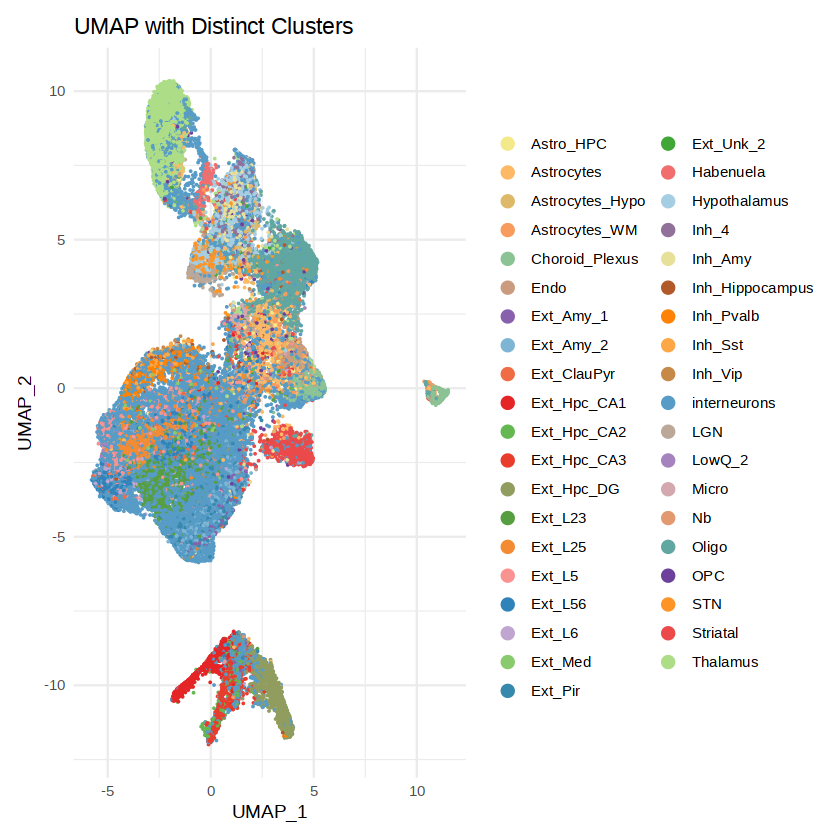

In [43]:
library(Seurat)
library(ggplot2)
library(RColorBrewer)
library(cowplot)

# Extract unique identities
unique_idents <- unique(Iris_Seurat@meta.data$NewIdents)

# Generate visually distinct colors
num_clusters <- length(unique_idents)
palette_colors <- colorRampPalette(brewer.pal(12, "Paired"))(num_clusters)

# Assign colors to each identity
names(palette_colors) <- unique_idents

# Plot UMAP with distinct colors
DimPlot(Iris_Seurat, group.by = "NewIdents", cols = palette_colors) +
  theme_minimal() +
  ggtitle("UMAP with Distinct Clusters")


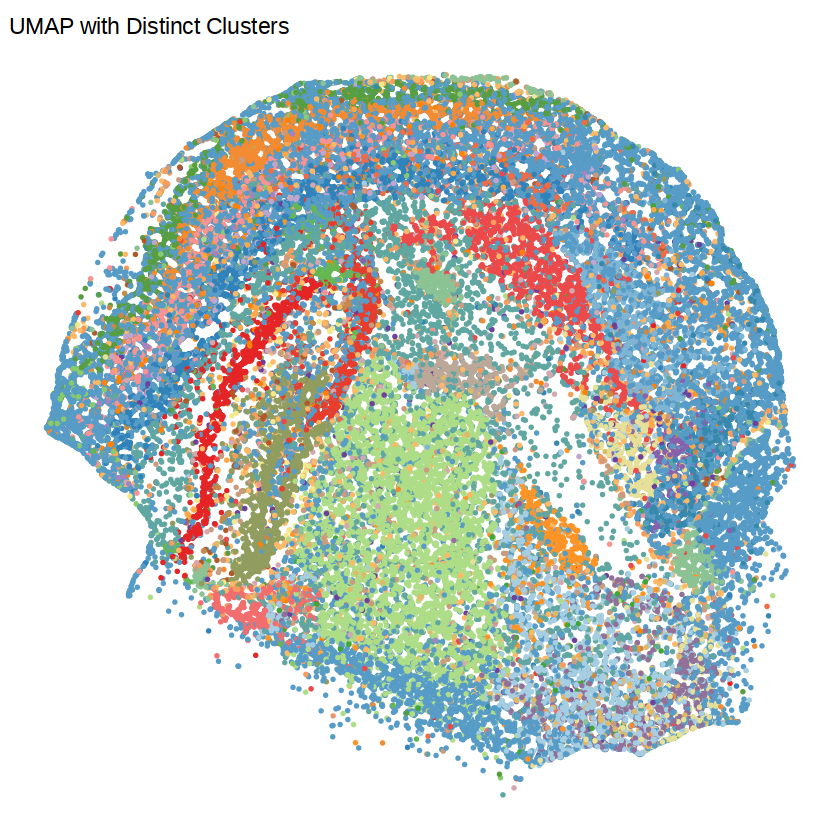

In [44]:
DimPlot(Iris_Seurat, group.by = "NewIdents", cols = palette_colors, reduction = "umapSpatial", pt.size = 0.5) +
  theme_void() +  # Removes background, grid, and axis lines
  ggtitle("UMAP with Distinct Clusters") +
  theme(
    axis.text = element_blank(),  # Remove axis text
    axis.ticks = element_blank(), # Remove axis ticks
    panel.border = element_blank(), # Remove panel border
    legend.text = element_text(family = "Helvetica", size = 14),  # Set legend font to Helvetica
    legend.title = element_text(family = "Helvetica", size = 14)+NoLegend()  # Ensure title is also Helvetica
  )+NoLegend()


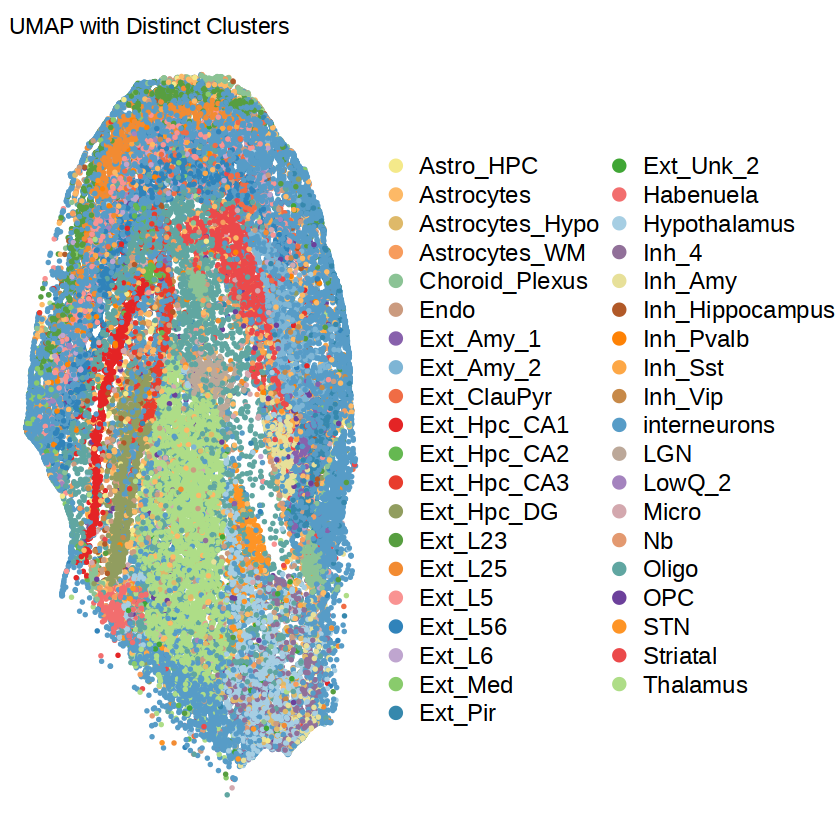

In [45]:
DimPlot(Iris_Seurat, group.by = "NewIdents", cols = palette_colors, reduction = "umapSpatial", pt.size = 0.5) +
  theme_void() +  # Removes background, grid, and axis lines
  ggtitle("UMAP with Distinct Clusters") +
  theme(
    axis.text = element_blank(),  # Remove axis text
    axis.ticks = element_blank(), # Remove axis ticks
    panel.border = element_blank(), # Remove panel border
    legend.text = element_text(family = "Helvetica", size = 14),  # Set legend font to Helvetica
    legend.title = element_text(family = "Helvetica", size = 14)+NoLegend()  # Ensure title is also Helvetica
  )


In [46]:
# Automatically update colors for all clusters containing "Thal"
palette_colors[grep("Thal", names(palette_colors))] <- "#FCE7C8"
# Automatically update colors for all clusters containing "Thal"
palette_colors[grep("Oligo", names(palette_colors))] <- "#FADA7A"

# Automatically update colors for all clusters containing "Thal"
palette_colors[grep("Striatal", names(palette_colors))] <- "#CBA35C"



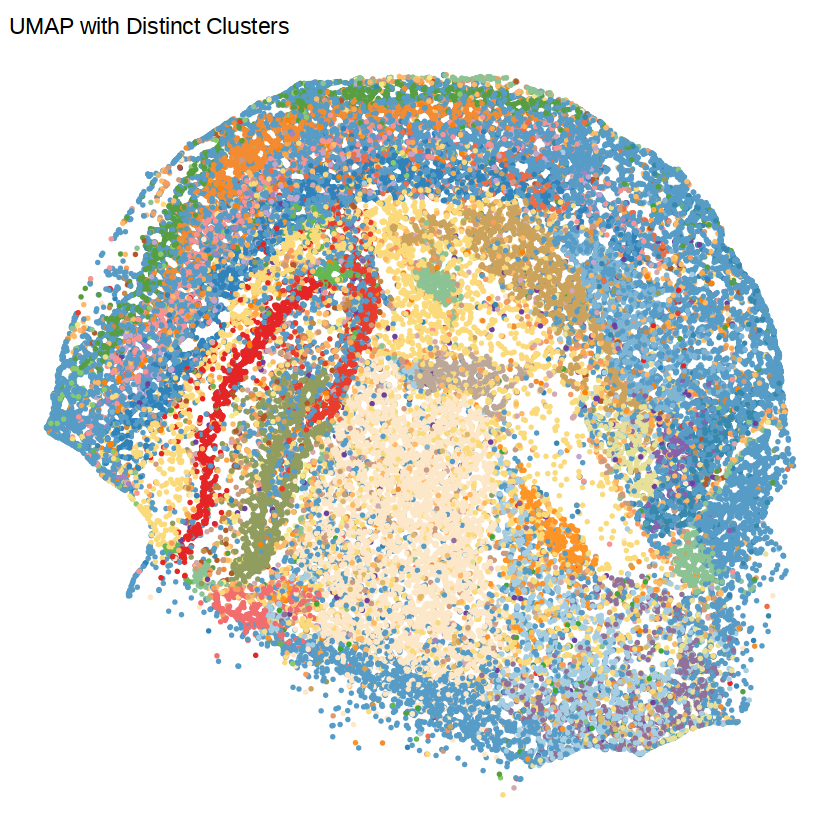

In [49]:
DimPlot(Iris_Seurat, group.by = "NewIdents", cols = palette_colors, reduction = "umapSpatial", pt.size = .5) +
  theme_void() +  # Removes background, grid, and axis lines
  ggtitle("UMAP with Distinct Clusters") +
  theme(
    axis.text = element_blank(),  # Remove axis text
    axis.ticks = element_blank(), # Remove axis ticks
    panel.border = element_blank(), # Remove panel border
    legend.text = element_text(family = "Helvetica", size = 14),  # Set legend font to Helvetica
    legend.title = element_text(family = "Helvetica", size = 14)+NoLegend()  # Ensure title is also Helvetica
  )+NoLegend()


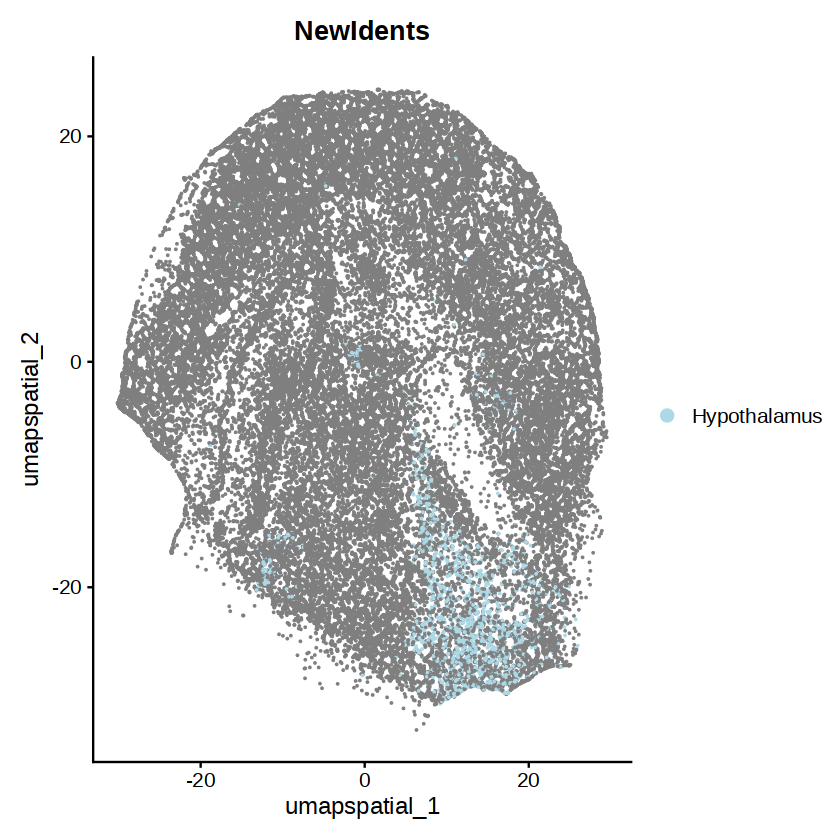

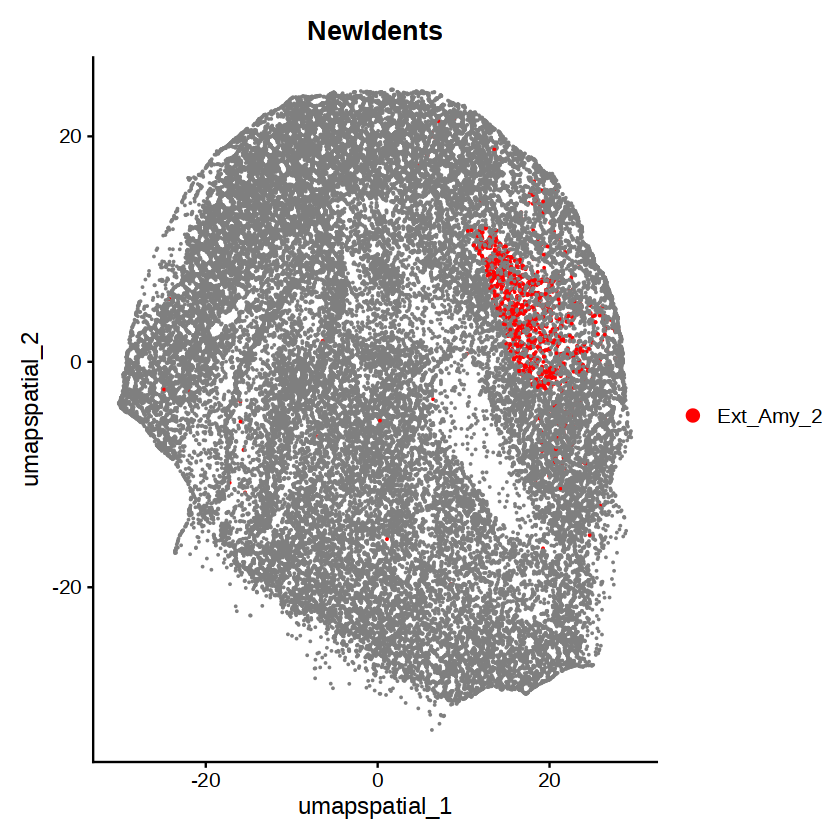

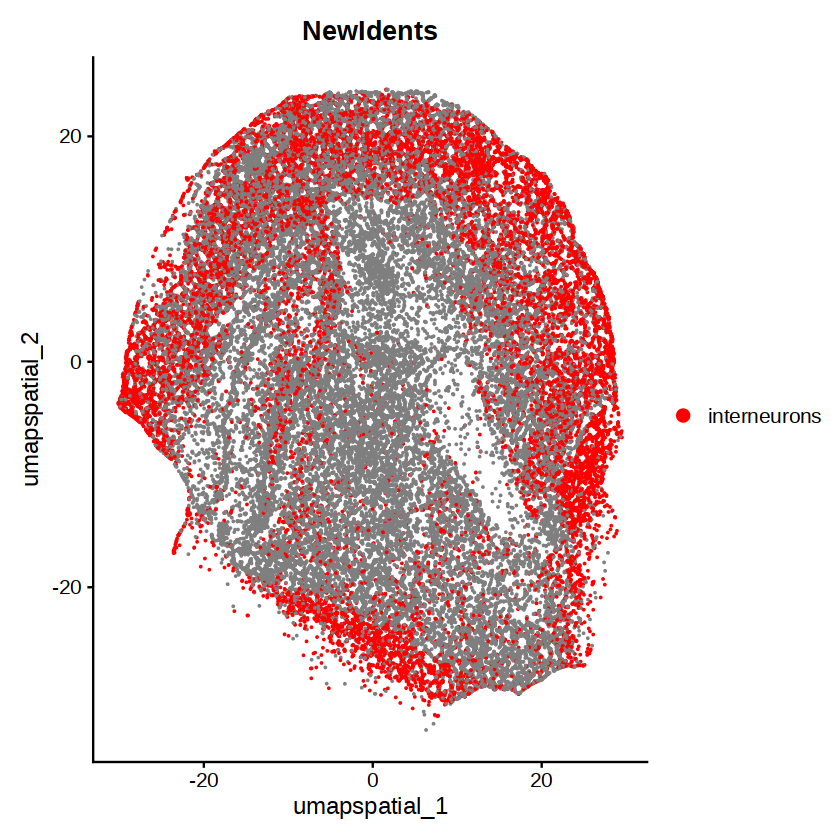

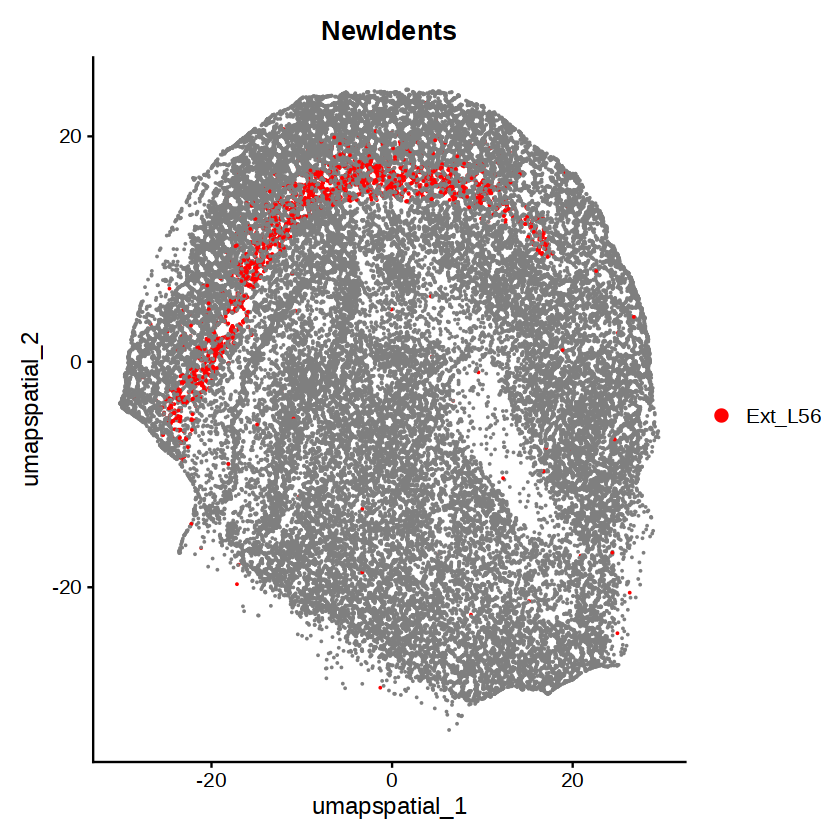

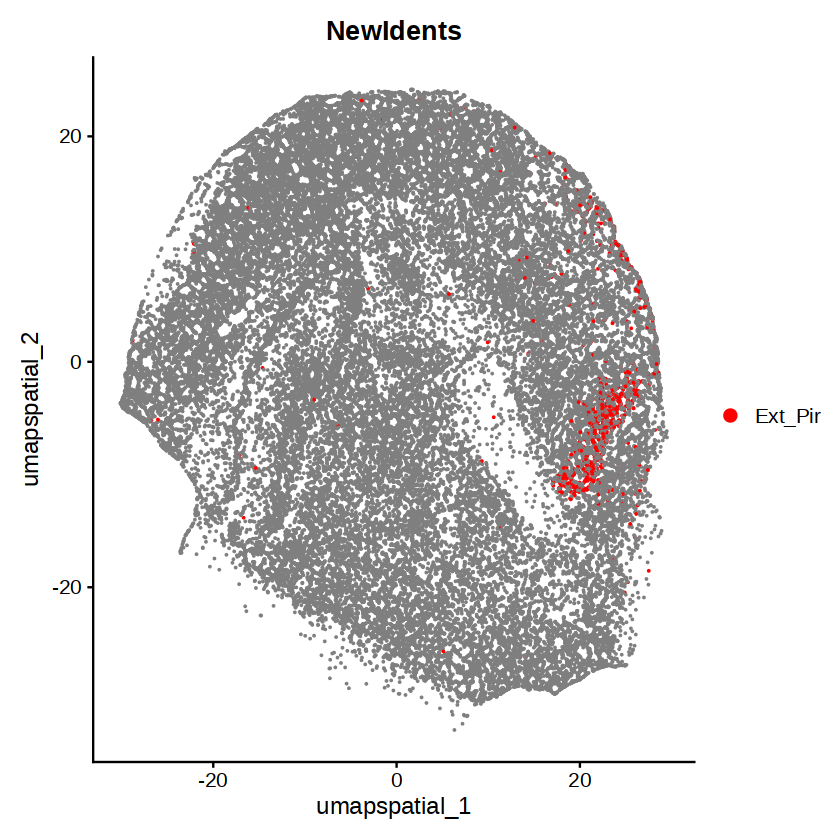

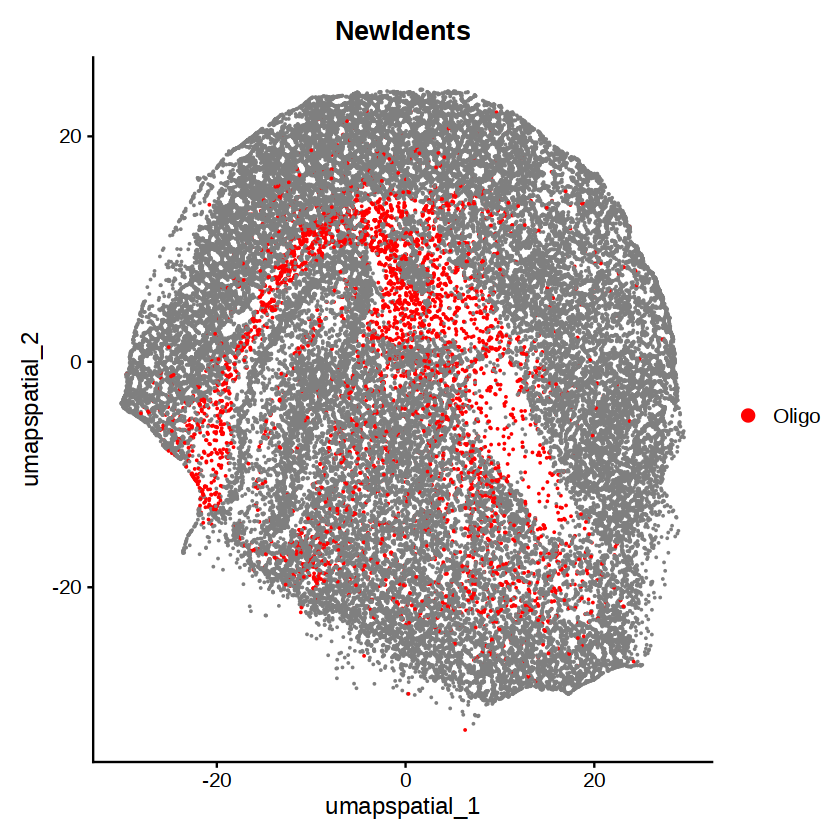

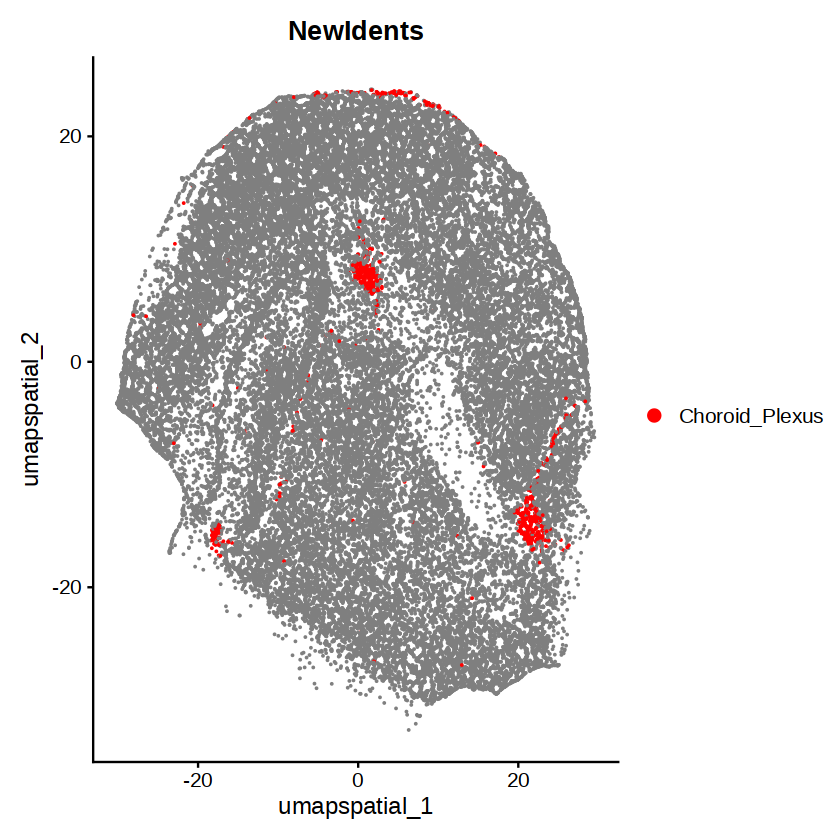

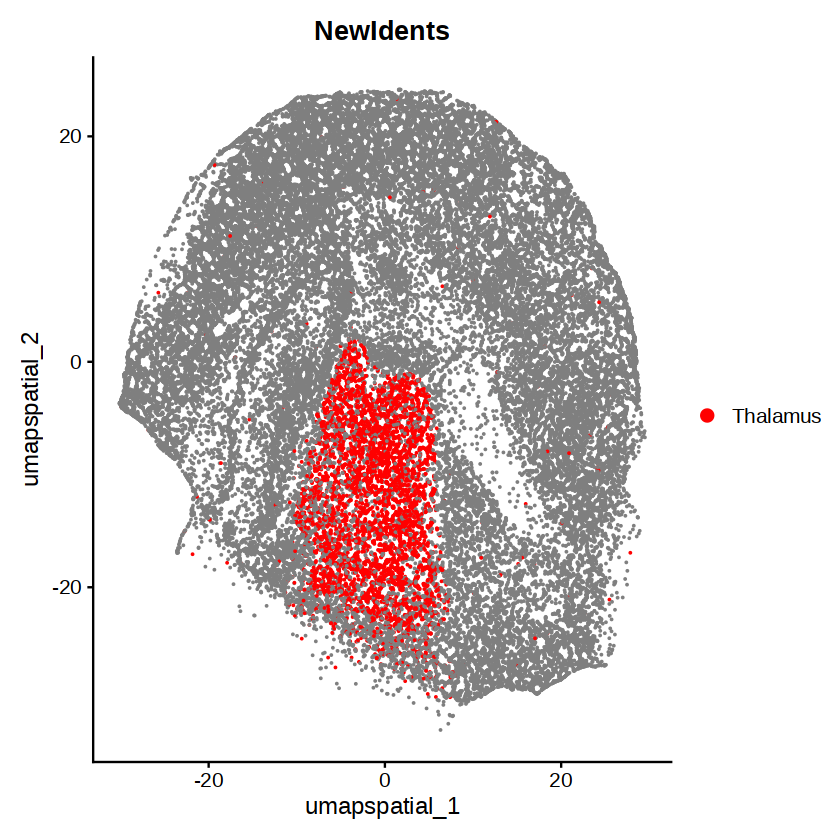

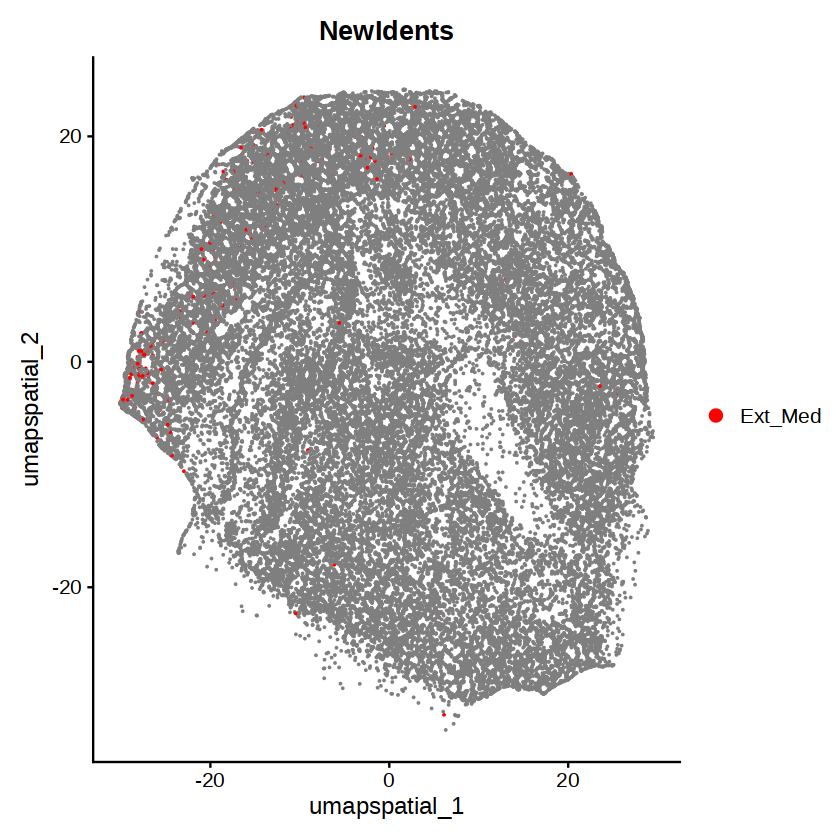

In [62]:
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Hypothalamus" = "#A94A4A"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Ext_Amy_2" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("interneurons" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Ext_L56" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Ext_Pir" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Oligo" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Choroid_Plexus" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Thalamus" = "red"))
DimPlot(Iris_Seurat, reduction = "umapSpatial",group.by = "NewIdents", cols = c("Ext_Med" = "red"))



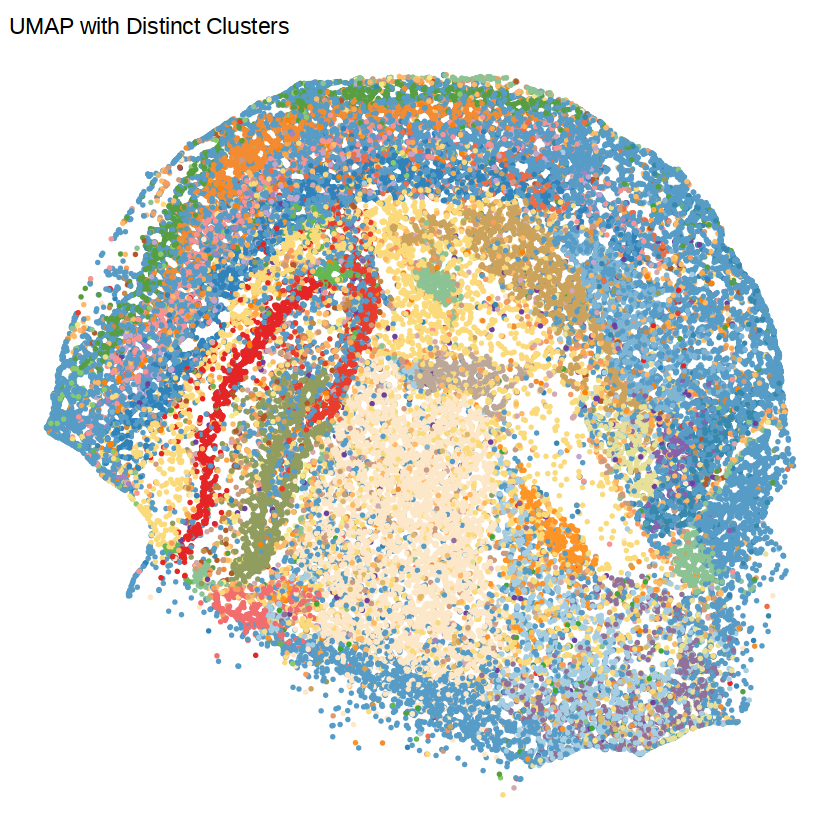

In [48]:
DimPlot(Iris_Seurat, group.by = "NewIdents", cols = palette_colors, reduction = "umapSpatial", pt.size = .5) +
  theme_void() +  # Removes background, grid, and axis lines
  ggtitle("UMAP with Distinct Clusters") +
  theme(
    axis.text = element_blank(),  # Remove axis text
    axis.ticks = element_blank(), # Remove axis ticks
    panel.border = element_blank(), # Remove panel border
    legend.text = element_text(family = "Helvetica", size = 14),  # Set legend font to Helvetica
    legend.title = element_text(family = "Helvetica", size = 14)+NoLegend()  # Ensure title is also Helvetica
  )+NoLegend()


In [152]:
library(ggplot2)
library(reshape2)

# Convert metadata to a data frame for ggplot
metadata_df <- Iris_Seurat@meta.data

# Rename columns for readability
colnames(metadata_df)[colnames(metadata_df) %in% c("nCount_RNA", "nFeature_RNA")] <- c("UMI_Counts", "Gene_Counts")

# Reshape data to long format for side-by-side boxplots
melted_data <- melt(metadata_df, measure.vars = c("UMI_Counts", "Gene_Counts"))

# Custom colors for each box plot
box_colors <- c("UMI_Counts" = "#8B5A2B", "Gene_Counts" = "#1F497D")  # Brown & Blue

# Set max y-axis limit
max_y <- 2000  # Adjust based on data range

# Generate Box Plot
pdf("Umi.pdf")
ggplot(melted_data, aes(x = variable, y = value, fill = variable)) +
  geom_boxplot(color = "black", outlier.shape = 16, outlier.colour = "black", outlier.size = 1) +
  scale_fill_manual(values = box_colors) +
  theme_minimal() +
  theme(
    text = element_text(family = "Helvetica"),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text.x = element_text(size = 14, face = "bold"),
    axis.text.y = element_text(size = 12),
    legend.position = "none",  # Remove legend for a cleaner look
    panel.grid = element_blank(),  # Remove grid
    panel.border = element_blank(),
    axis.line = element_line(color = "black", size = 1),  # Add x and y axis lines
    axis.ticks = element_line(color = "black", size = 1)  # Add ticks to both axes
  ) +
  coord_cartesian(ylim = c(0, max_y))  # Set y-axis max limit
dev.off()


pdf 
  2

In [138]:
pdf("Plotcells.pdf")
DimPlot(Iris_Seurat, group.by = "Idents", cols = palette_colors, reduction ="umapSpatial", pt.size = 0.5) +
  theme_void() +  # Removes background, grid, and axis lines
  ggtitle("UMAP with Distinct Clusters") +
  NoLegend() + 
  theme(
    axis.text = element_blank(),  # Remove axis text
    axis.ticks = element_blank(), # Remove axis ticks
    panel.border = element_blank() # Remove panel border
  )



# Define custom colors as a named vector
custom_colors <- c(
  "Ext_Hpc_CA1" = "#1f77b4",
  "Ext_Hpc_CA2" = "#ff7f0e",
  "Ext_Hpc_CA3" = "#2ca02c",
  "Ext_Hpc_DG1" = "orange",
  "Ext_Hpc_DG2" = "orange",
  "Ext_L23" = "#8c564b",
  "Ext_L25" = "#e377c2",
  "Ext_L5_1" = "#7f7f7f",
  "Astro_THAL_med" = "#bcbd22",
  "Ext_L56" = "#17becf","Astro_THAL_med" = "#D99D81","Astro_THAL_lat" ="#DF9755" , "Astro_THAL_hab"= "#C890A7",
    "Oligo_1"="#A31D1D","Oligo_2"="#A31D1D","OPC_1"="#809D3C","OPC_2"="#F4FFC3"
  
)

# Plot with custom colors
DimPlot(
  Iris_Seurat, 
  group.by = "Idents", 
  reduction = "umapSpatial", 
  cols = custom_colors, pt.size = .5
) + NoLegend()


custom_colors <- c(
  "Ext_Hpc_CA1" = "#1f77b4",
  "Ext_Hpc_CA2" = "#ff7f0e",
  "Ext_Hpc_CA3" = "#2ca02c",
  "Ext_Hpc_DG1" = "orange",
  "Ext_Hpc_DG2" = "orange",
  "Ext_L23" = "#8c564b",
  "Ext_L25" = "#e377c2",
  "Ext_L5_1" = "#7f7f7f",
  "Astro_THAL_med" = "#bcbd22",
  "Ext_L56" = "#17becf","Astro_THAL_med" = "#D99D81","Astro_THAL_lat" ="#DF9755" , "Astro_THAL_hab"= "#C890A7",
    "Oligo_1"="#A31D1D","Oligo_2"="#A31D1D","OPC_1"="#809D3C","OPC_2"="#F4FFC3"
  
)

# Plot with custom colors
DimPlot(
  Iris_Seurat, 
  group.by = "Idents", 
  reduction = "umapSpatial", 
  cols = custom_colors, pt.size = .5
) 




dev.off()


pdf 
  2

Warning message:
“Removed 5102 rows containing missing values (geom_point).”
Warning message:
“Removed 5102 rows containing missing values (geom_point).”
Warning message:
“Removed 5102 rows containing missing values (geom_point).”


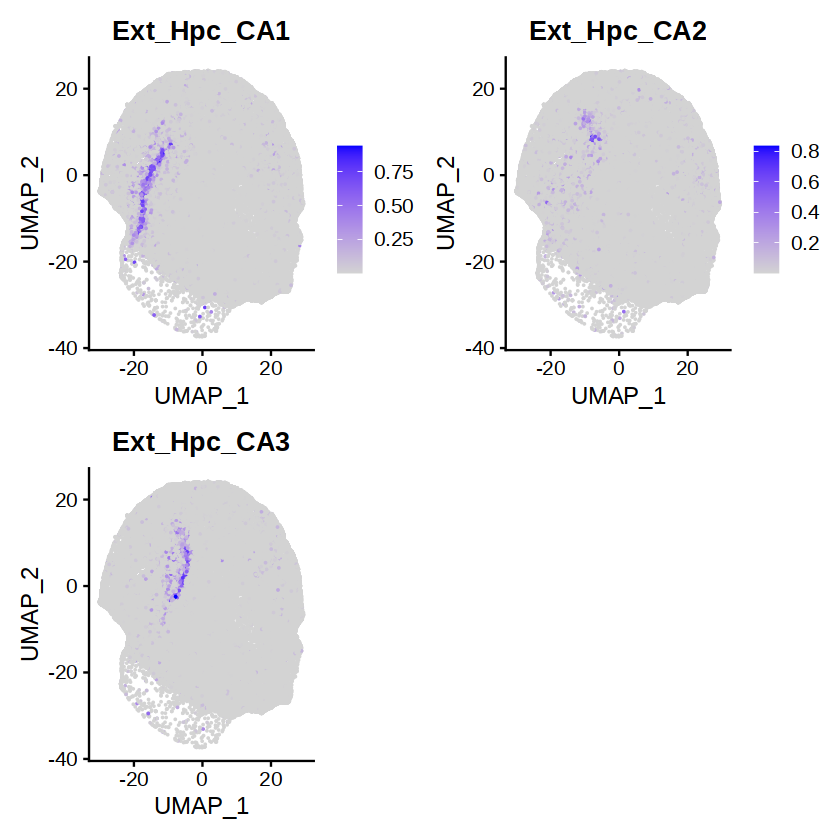

In [52]:
FeaturePlot(Iris_Seurat,c("Ext_Hpc_CA1","Ext_Hpc_CA2","Ext_Hpc_CA3"), reduction = "umapSpatial",raster=FALSE)+NoLegend()



In [42]:
pdf("pdf_subtype.png")
FeaturePlot(Iris_Seurat,"Ext_Hpc_CA1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Hpc_CA2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Hpc_CA3", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_ClauPyr", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Endo", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Thal_1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Thal_2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Hpc_DG1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Hpc_DG2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L23", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L25", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L5_1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L5_2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L5_3", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L56", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L6", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_L6B", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Med", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Ext_Pir", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Micro", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Oligo_1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Oligo_2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"OPC_1", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"OPC_2", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_AMY", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_AMY_CTX", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_CTX", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_HPC", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_HYPO", reduction = "umapSpatial",raster=FALSE)+NoLegend()

FeaturePlot(Iris_Seurat,"Astro_STR", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_THAL_hab", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_THAL_lat", reduction = "umapSpatial",raster=FALSE)+NoLegend()
FeaturePlot(Iris_Seurat,"Astro_THAL_med", reduction = "umapSpatial",raster=FALSE)+NoLegend()
dev.off()

Warning message:
“Removed 8923 rows containing missing values (geom_point).”
Warning message:
“Removed 8923 rows containing missing values (geom_point).”
Warning message:
“Removed 8923 rows containing missing values (geom_point).”
Warning message:
“Removed 8923 rows containing missing values (geom_point).”
